In [1]:
%run "../HyperParameterOpt/GenerateExperiments/res_experiment.py"
import copy
import numpy as np
import networkx as nx
from scipy import sparse
from math import floor
import os
import graph_tool.all as gt
import matplotlib.pyplot as plt

plt.switch_backend("cairo")


## Nine Plots to Explain Our Findings

In [2]:
DIFF_EQ_PARAMS = {
                  "x0": [-20, 10, -.5],
                  "begin": 0,
                  "end": 85,
                  "timesteps": 85000,
                  "train_per": .889,
                  "solver": lorenz_equ,
                  "clip": 40
                 }

RES_PARAMS = {
              "uniform_weights": True,
              "solver": "ridge",
              "ridge_alpha":.0001,
              "signal_dim": 3,
              "network": "random graph",

              "res_sz": 50,
              "activ_f": np.tanh,
              "connect_p": .1,
              "spect_rad": 50,
              "gamma": 50,
              "sigma": 1,
              "sparse_res": True,
             }

TOL = 5

In [3]:
def erdos(mean_degree,n=None):
    """ Erdos-Renyi random graph.
    Parameter
        mean_degree     (int): specific to this topology
        n               (int): n is the size of the network
    """
    if n is None:
        n = np.random.randint(smallest_network_size,biggest_network_size)
    p = mean_degree/n
    A = nx.adj_matrix(nx.erdos_renyi_graph(n,p)).T
    return sparse.dok_matrix(A)

def remove_edges(A, p):
    """ Randomly removes 'p' percent of edges from a sparse matrix 'A'
    """
    nedges = floor(p*np.sum(A != 0))
    A = A.todok()
    # Remove Edges
    keys = list(A.keys())
    remove_idx = np.random.choice(range(len(keys)),size=nedges, replace=False)
    remove = [keys[i] for i in remove_idx]
    for e in remove:
        A[e] = 0
    return A

def erdos_err(rho, remove_p, mean_degree, plot=False):
    n = RES_PARAMS["res_sz"]
    RES_PARAMS["spect_rad"] = rho
    A = remove_edges(erdos(mean_degree, n), remove_p)
    A = sparse.lil_matrix(A)
    DIFF_EQ_PARAMS["x0"] = random_lorenz_x0()
    train_t, test_t, u = rc_solve_ode(DIFF_EQ_PARAMS)
    rc = ResComp(A, **RES_PARAMS)
    rc.state_0 = 2*np.random.rand(rc.res_sz) - 1
    r0 = rc.state_0
    err, R = rc.fit(train_t, u, return_states=True)
    acc_dur = how_long_accurate(u(test_t), rc.predict(test_t), tol=TOL)
    print(f"VPT: {acc_dur}")
    if plot:
        p = plot_states(train_t, R, u(train_t), err, rho)
        return p
    return err, 100

def erdos_plot(A, rho, remove_p, node_color=None):
    n = RES_PARAMS["res_sz"]
    RES_PARAMS["spect_rad"] = rho
    DIFF_EQ_PARAMS["x0"] = random_lorenz_x0()
    train_t, test_t, u = rc_solve_ode(DIFF_EQ_PARAMS)
    rc = ResComp(A, **RES_PARAMS)
    rc.state_0 = 2*np.random.rand(rc.res_sz) - 1
    r0 = rc.state_0
    err, R = rc.fit(train_t, u, return_states=True)
    acc_dur = how_long_accurate(u(test_t), rc.predict(test_t), tol=TOL)
    print(f"VPT: {acc_dur}")
    p = plot_states(train_t, R, u(train_t), err, rho, title=False, node_color=node_color)
    return p


def ident_err(rho, remove_p, mean_degree, plot=False):
    n = RES_PARAMS["res_sz"]
    RES_PARAMS["spect_rad"] = rho
    A = remove_edges(rho * sparse.eye(n), remove_p)
    A = sparse.lil_matrix(A)
    DIFF_EQ_PARAMS["x0"] = random_lorenz_x0()
    train_t, test_t, u = rc_solve_ode(DIFF_EQ_PARAMS)
    rc = ResComp(A, **RES_PARAMS)
    rc.state_0 = 2*np.random.rand(rc.res_sz) - 1
    r0 = rc.state_0
    err, R = rc.fit(train_t, u, return_states=True)
    acc_dur = how_long_accurate(u(test_t), rc.predict(test_t), tol=TOL)
    print(f"VPT: {acc_dur}")
    print([(k, rc.__dict__[k]) for k in RES_PARAMS.keys()])
    if plot:
        p = plot_states(train_t, R, u(train_t), err, rho)
        return p
    return err, 100

def plot_states(t, R, U, err, rho, title=True, node_color=None):
    
    if node_color is None:
        p = plt.plot(t-40, R)
    for i in range(R.shape[1]):
        p = plt.plot(t - 40, R[:, i], c=node_color[i])
    end=10
    if title:
        plt.title(f"$\\rho = {rho}$ ", fontsize=16)
    plt.ylim([-1.1, 1.1])
    plt.xlim([0, end + 0.1])
    plt.xticks([], [])
    plt.yticks([], [], fontsize=18)
    #plt.xlabel("Time", fontsize=16)
    #plt.ylabel("Node State", fontsize=16)
    print(f"Error {err}")
    return p

def erdos_ax(ax, A, rho, remove_p, node_color=None):
    n = RES_PARAMS["res_sz"]
    RES_PARAMS["spect_rad"] = rho
    DIFF_EQ_PARAMS["x0"] = random_lorenz_x0()
    train_t, test_t, u = rc_solve_ode(DIFF_EQ_PARAMS)
    rc = ResComp(A, **RES_PARAMS)
    rc.state_0 = 2*np.random.rand(rc.res_sz) - 1
    r0 = rc.state_0
    err, R = rc.fit(train_t, u, return_states=True)
    acc_dur = how_long_accurate(u(test_t), rc.predict(test_t), tol=TOL)
    print(f"VPT: {acc_dur}")
    p = plot_states_ax(ax, train_t, R, u(train_t), err, rho, title=False, node_color=node_color)
    return p

def plot_states_ax(ax, t, R, U, err, rho, title=True, node_color=None, xlab=False):
    
    if node_color is None:
        p = ax.plot(t-40, R)
    for i in range(R.shape[1]):
        p = ax.plot(t - 40, R[:, i], c=node_color[i])
    end=10
    if title:
        ax.set_title(f"$\\rho = {rho}$ ", fontsize=16)
    ax.set_ylim([-1.1, 1.1])
    ax.set_xlim([0, end + 0.1])
    if not xlab:
        ax.set_xticks([], [])
    ax.set_yticks([-1,1])
    print(f"Error {err}")
    return ax

def nx_to_gt(G):
    nx.write_graphml(G, "temp.xml")
    g = gt.load_graph("temp.xml")
    os.remove("temp.xml")
    return g

def simple_gt_plot(G, mplaxis, colors=None, vertex_size=1.0):
    g = nx_to_gt(G)
    if colors is not None:
        color_map = {i:colors[i] for i in range(50)}
        # Create new vertex property
        plot_color = g.new_vertex_property('vector<double>')
        # add that property to graph
        g.vertex_properties['plot_color'] = plot_color
        # assign a value to that property for each node of that graph
        for v in g.vertices():
            plot_color[v] = color_map[v]
        vertex_fill_color = g.vertex_properties['plot_color']
        
    else:
        vertex_fill_color=None
    if mplaxis is None:
        fig, mplaxis = plt.subplots(1, 1, figsize=(12, 11.5))

    gt.graph_draw(g, vertex_fill_color=vertex_fill_color, vertex_size=vertex_size, mplfig=mplaxis)
    mplaxis.set_axis_off()

VPT: 89
Error 1.6269948310898306
VPT: 66
Error 1.37687174891883
VPT: 8
Error 1.9725670929474732
VPT: 247
Error 2.5152102342519007
VPT: 123
Error 1.8300397280720277
VPT: 27
Error 1.9476124204534062
VPT: 0
Error 7.189858341584361
VPT: 63
Error 4.6806432595037855
VPT: 82
Error 3.744584038517321


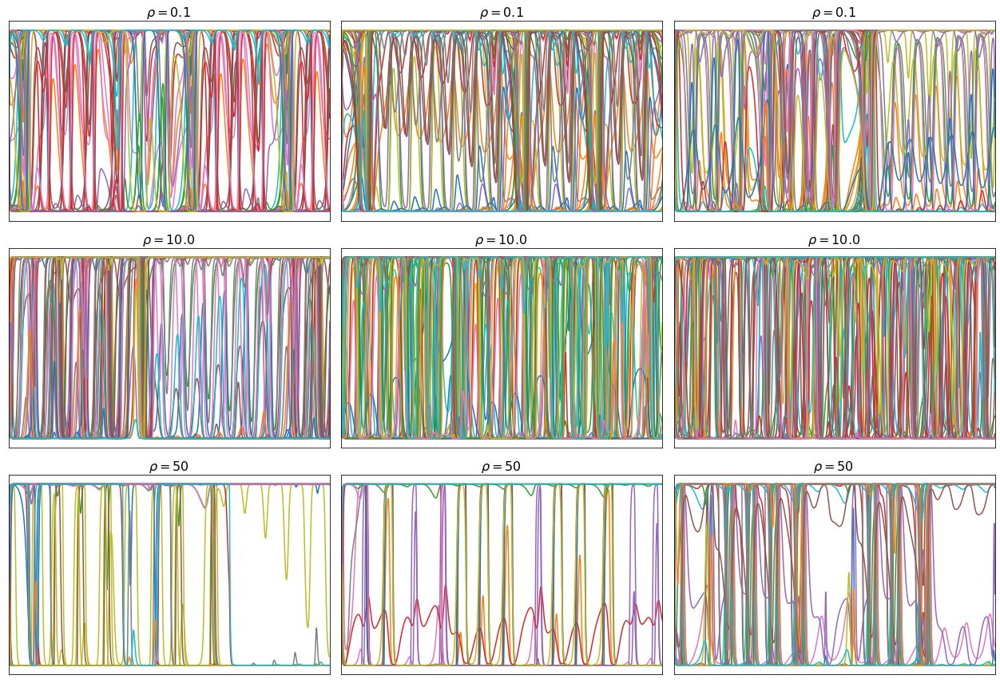

In [4]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 10.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 4, plot=True)
        i += 1
        
plt.tight_layout()

## Turn down sigma

In [5]:
RES_PARAMS["sigma"] = 0.15

VPT: 561
Error 0.022571474300403817
VPT: 3395
Error 0.02059120278184984
VPT: 566
Error 0.022507133268589566
VPT: 36
Error 0.8379029615085688
VPT: 1177
Error 0.20930696295792495
VPT: 347
Error 0.4124270558258995
VPT: 0
Error 12.109059163338799
VPT: 56
Error 3.2392004958765788
VPT: 472
Error 0.7981258356464968


/usr/local/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


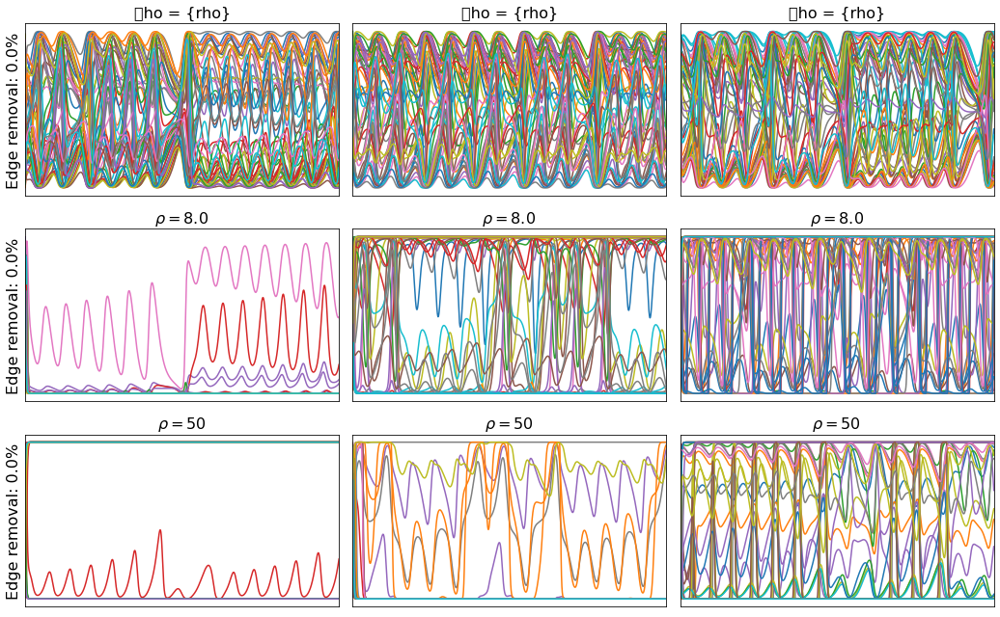

In [6]:
plt.rcParams["figure.figsize"] = [14.5, 9]
i = 1
for rho in [.5, 8.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 4, plot=True)
        if (i-1) % 3 == 0:
            plt.ylabel(f"Edge removal: {remove_p * 100}%", fontsize=16)
        if i < 4:
            plt.title("\rho = {rho}", fontsize = 16)
        i += 1
        
plt.tight_layout()

### Turn down sigma more

In [7]:
RES_PARAMS["sigma"] = 0.05

VPT: 829
Error 0.020309972083407613
VPT: 742
Error 0.013428048783838084
VPT: 1861
Error 0.015505914903564481
VPT: 4995
Error 0.013797332579684678
VPT: 1653
Error 0.011854290149670885
VPT: 2941
Error 0.011064139054672607
VPT: 0
Error 7.178738431516914
VPT: 170
Error 0.47876405286284196
VPT: 856
Error 0.10021577567286968


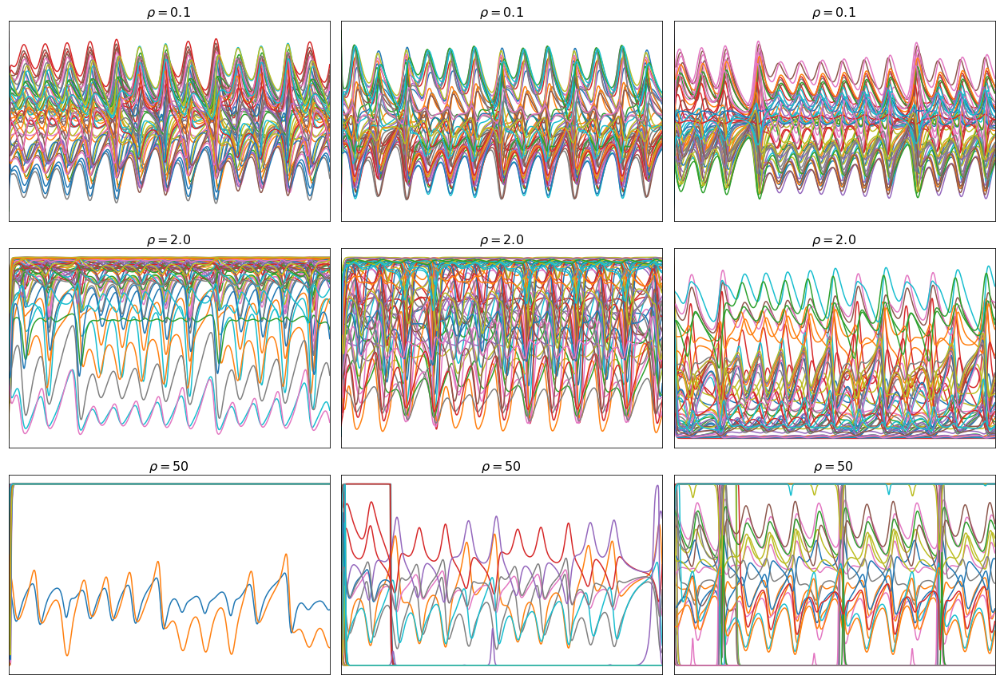

In [8]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 2.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 4, plot=True)
        i += 1
        
plt.tight_layout()

#### Turn sigma back up, turn down mean degree

In [9]:
RES_PARAMS["sigma"] = 0.15

VPT: 3079
Error 0.018180106864858613
VPT: 2709
Error 0.029926724428376912
VPT: 1666
Error 0.043405917691670216
VPT: 31
Error 0.09427182351759987
VPT: 987
Error 0.05000972980437789
VPT: 4057
Error 0.019172480531954524
VPT: 55
Error 3.136887607341052
VPT: 436
Error 0.5816897029490173
VPT: 2251
Error 0.05904613393828981


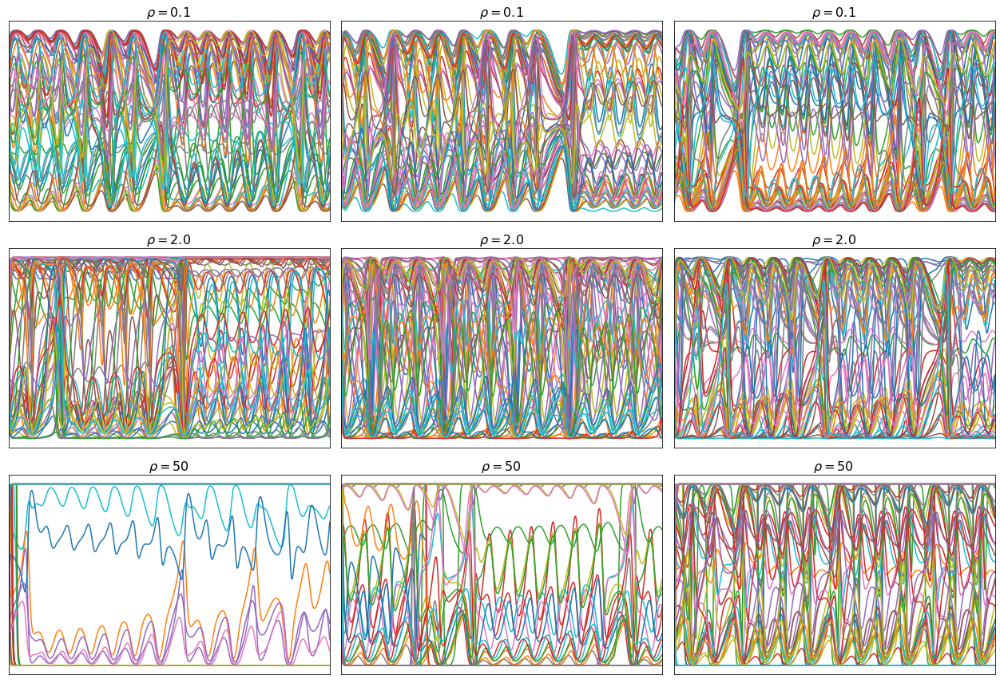

In [10]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 2.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 2, plot=True)
        i += 1
        
plt.tight_layout()

# Turn down gamma

In [19]:
RES_PARAMS["gamma"] = 5.0

VPT: 19
Error 4.044726770566702
VPT: 1209
Error 0.25953550065073844
VPT: 2453
Error 0.21621533060011683
VPT: 291
Error 0.705338421447488
VPT: 1403
Error 0.3156299177872879
VPT: 1834
Error 0.2858432646024623
VPT: 455
Error 0.8592834596883044
VPT: 2425
Error 0.2773571857079097
VPT: 1222
Error 0.21207459364401263


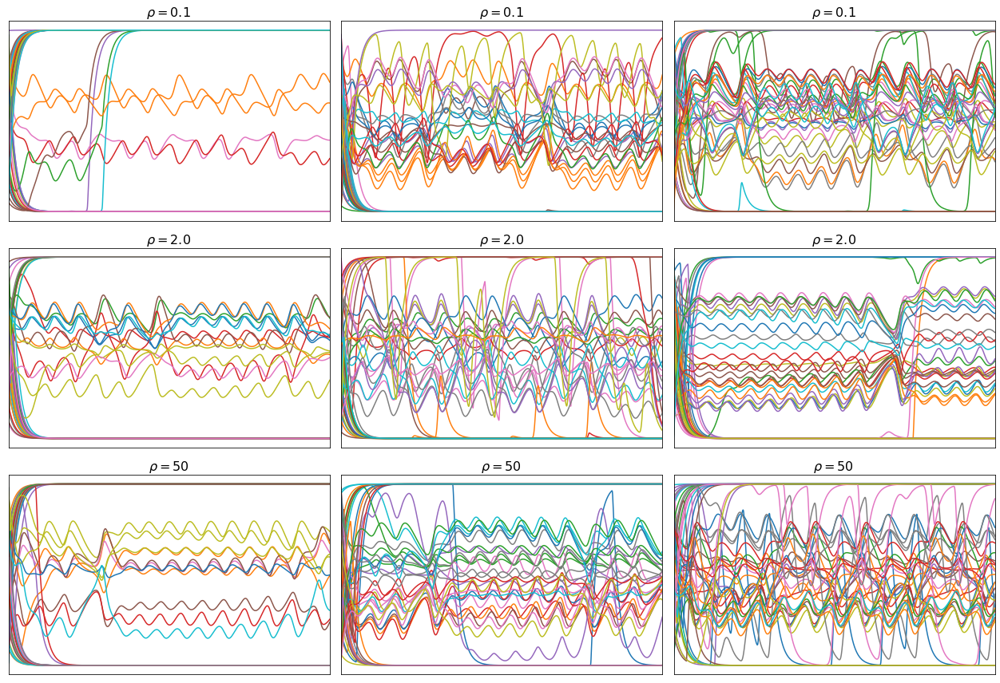

In [20]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 2.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 2, plot=True)
        i += 1
        
plt.tight_layout()

## Turn down mean degree more

In [28]:
RES_PARAMS["gamma"] = .5

VPT: 1211
Error 0.7191554400032341
VPT: 494
Error 0.6720445783765234
VPT: 642
Error 0.5908881808972459
VPT: 543
Error 0.9166290187388163
VPT: 2149
Error 0.7716627890947432
VPT: 761
Error 0.5498092840699849
VPT: 1620
Error 0.5424073094324396
VPT: 1275
Error 0.5512655089114563
VPT: 1070
Error 0.47978018696862546


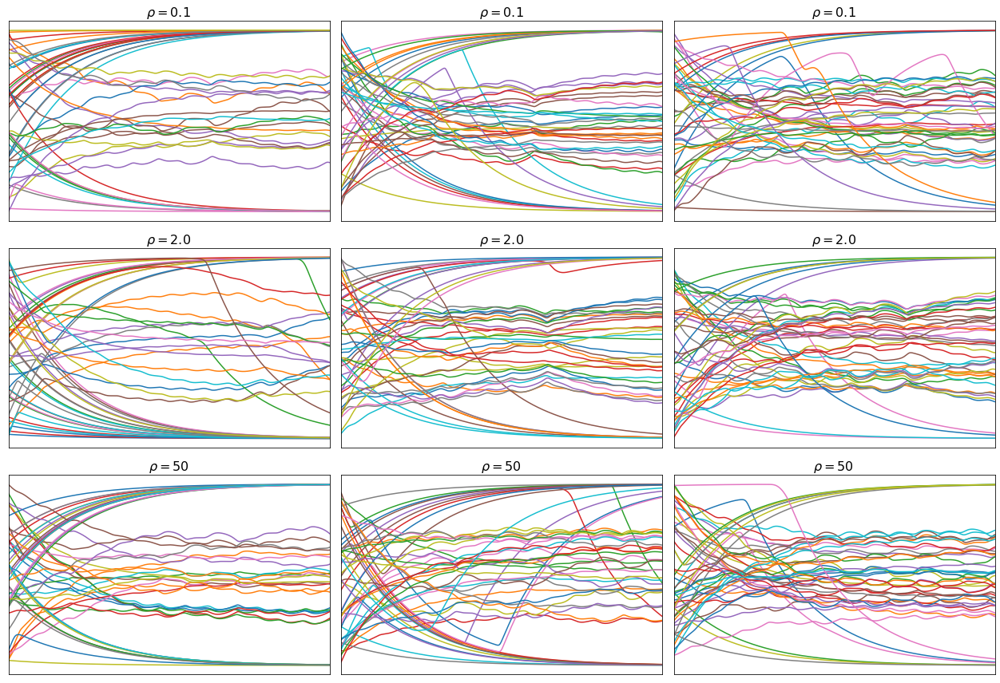

In [29]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 2.0, 50]:
    for remove_p in [0.0, .5, .7]:
        plt.subplot(3,3, i)
        erdos_err(rho, remove_p, 1, plot=True)
        i += 1
        
plt.tight_layout()

# Identity Matrix

In [61]:
RES_PARAMS = {
              "uniform_weights": True,
              "solver": "ridge",
              "ridge_alpha":.0001,
              "signal_dim": 3,
              "network": "random graph",

              "res_sz": 50,
              "activ_f": np.tanh,
              "connect_p": .1,
              "spect_rad": 50,
              "gamma": 50,
              "sigma": .3,
              "sparse_res": True,
             }

VPT: 1077
[('uniform_weights', True), ('solver', 'ridge'), ('ridge_alpha', 0.0001), ('signal_dim', 3), ('network', 'unknown topology'), ('res_sz', 50), ('activ_f', <ufunc 'tanh'>), ('connect_p', 0.002), ('spect_rad', 0.1), ('gamma', 50), ('sigma', 0.3), ('sparse_res', True)]
Error 0.12560259816887057
VPT: 144
[('uniform_weights', True), ('solver', 'ridge'), ('ridge_alpha', 0.0001), ('signal_dim', 3), ('network', 'unknown topology'), ('res_sz', 50), ('activ_f', <ufunc 'tanh'>), ('connect_p', 0.01), ('spect_rad', 0.1), ('gamma', 50), ('sigma', 0.3), ('sparse_res', True)]
Error 0.14007101334470662
VPT: 116
[('uniform_weights', True), ('solver', 'ridge'), ('ridge_alpha', 0.0001), ('signal_dim', 3), ('network', 'unknown topology'), ('res_sz', 50), ('activ_f', <ufunc 'tanh'>), ('connect_p', 0.006), ('spect_rad', 0.1), ('gamma', 50), ('sigma', 0.3), ('sparse_res', True)]
Error 0.12538430359529126
VPT: 583
[('uniform_weights', True), ('solver', 'ridge'), ('ridge_alpha', 0.0001), ('signal_dim',

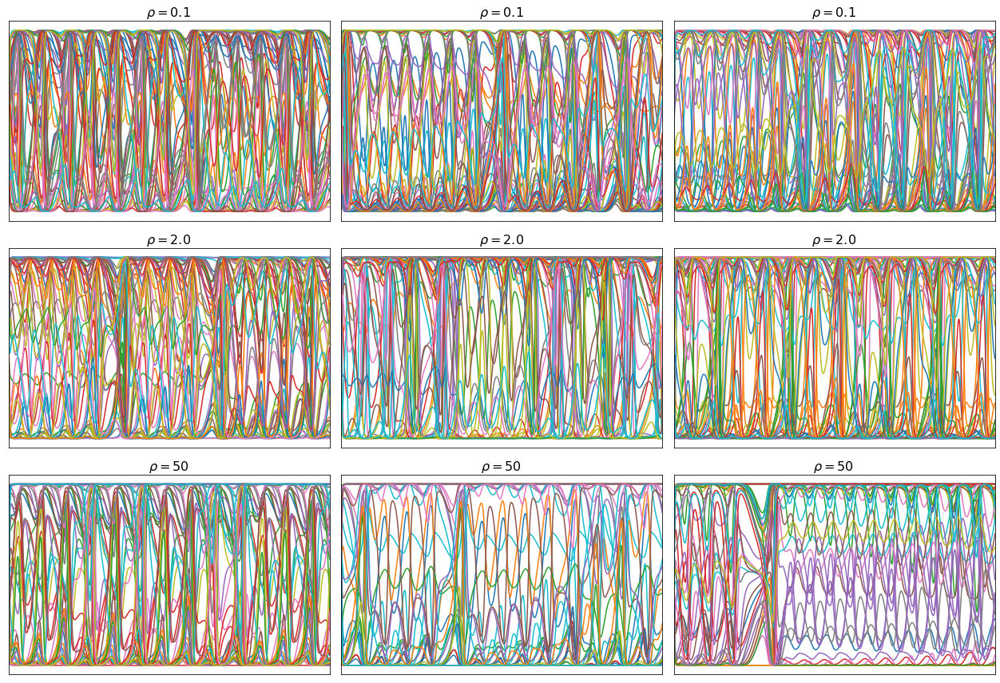

In [62]:
plt.rcParams["figure.figsize"] = [17.5, 12]
i = 1
for rho in [.1, 2.0, 50]:
    for remove_p in [0.9, .5, .7]:
        plt.subplot(3,3, i)
        ident_err(rho, remove_p, 1, plot=True)
        i += 1
        
plt.tight_layout()

# Final Draft

In [11]:
RES_PARAMS = {
              "uniform_weights": True,
              "solver": "ridge",
              "ridge_alpha":.0001,
              "signal_dim": 3,
              "network": "random graph",

              "res_sz": 50,
              "activ_f": np.tanh,
              "connect_p": .1,
              "spect_rad": 50,
              "gamma": 5,
              "sigma": .15,
              "sparse_res": True,
             }

mean_degree=4.0
n = 50

def plot_states(t, R, U, err, rho):
    p = plt.plot(t - 40, R)
    end=10
    #plt.title(f"$\\rho = {rho}$ ", fontsize=16)
    plt.ylim([-1.1, 1.1])
    plt.xlim([0, end + 0.1])
    plt.xticks([], [])
    plt.yticks([], [], fontsize=18)
    #plt.xlabel("Time", fontsize=16)
    #plt.ylabel("Node State", fontsize=16)
    print(f"Error {err}")
    return p    

In [12]:
G = sparse.lil_matrix(erdos(mean_degree, n))
nx.draw_spring(nx.DiGraph(G), node_color="k", arrows=False)

In [14]:
plt.rcParams["figure.figsize"] = [18, 8]
titlesz = 16

n = 50
i = 1
nc = np.random.rand(n, 3)

fig, ax = plt.subplots(3,4, figsize=(18, 8))
for i,remove_p in enumerate([0.0, .5, .85]):
    
    A = sparse.lil_matrix(remove_edges(G, remove_p))
    # Draw the network
    currax = ax[i,0]
    if i == 0:
        currax.set_title("Processing Network", fontsize=titlesz)
    simple_gt_plot(nx.Graph(A), currax, colors=nc)
    currax.set_xlabel("$p_{thin}=$"+f"{remove_p}", fontsize = titlesz)
    
    # Draw a row of plots
    for j, rho in enumerate([.5, 8.0, 50]):
        currax = ax[i, j+1]
        erdos_ax(currax, A, rho, remove_p, node_color=nc)
        if (j==0):
            currax.set_ylabel("$p_{thin}=$"+f"{remove_p}", fontsize = titlesz)
        if (i==0):
            currax.set_title(f"$\\rho={rho}$", fontsize=titlesz)
        if (i==2):
            currax.set_xticks([0,5,10])
            currax.set_xlabel("Time (a.u.)")
    
plt.tight_layout()
plt.savefig("nineplots.png")

VPT: 3396


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


Error 0.08872284167568226
VPT: 102
Error 2.1064528788325014


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


VPT: 0
Error 10.152312274906112


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


VPT: 3210
Error 0.08667407409540101


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


VPT: 561


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


Error 0.6914484977588923
VPT: 0


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


Error 3.594269149975546
VPT: 1579
Error 0.06907501728225937


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


VPT: 1283
Error 0.1435209194865456


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


VPT: 4810
Error 0.11167831495462907


/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later


# Lyapunov Exponent

In [109]:
RES_PARAMS = {
              "uniform_weights": True,
              "solver": "ridge",
              "ridge_alpha":.0001,
              "signal_dim": 3,
              "network": "random graph",

              "res_sz": 2500,
              "activ_f": np.tanh,
              "connect_p": .02,
              "spect_rad": 50,
              "gamma": 50,
              "sigma": .15,
              "sparse_res": True,
             }

LYAP_REPS = 1

def lyapunov(t, x, xdelta, delta0):
    """ Estimate the largest lyapunov exponent according to the algorithm in
                Michael T. Rosenstein, James J. Collins, Carlo J. De Luca,
                A practical method for calculating largest Lyapunov exponents from small data sets,
                Physica D: Nonlinear Phenomena,
                Volume 65, Issues 1–2,
                1993.
        Parameters
        ----------
        t (array): n time values
        x (array): nxd matrix where d is the dimension of the system. The ith row
                  of x is equal to the state of the system at time t[i]
        xd (array): nxd matrix of system states when x(0) is perturbed by delta
        delta (array): Array of length d. Perturbation to initial condition
        Returns
        -------
        lam (float): Estimate of the largest lypunov exponent
    """
    delta = x - xdelta
    deltanorm = np.sum(delta**2, axis=1)**0.5
    delta0norm = np.sum(delta**2)**0.5
    logdelta = np.log(deltanorm/delta0norm)
    one = np.ones(len(t))
    A = np.vstack((one, t)).T
    x, res, rank, sigma = np.linalg.lstsq(A, logdelta, rcond=None)
    lam = x[1]
    return lam

def meanlyap(rcomp, pre, r0, ts, pert_size=1e-6):
    """ Average lyapunov exponent across LYAP_REPS repititions """
    lam = 0
    for i in range(LYAP_REPS):
        delta0 = np.random.randn(r0.shape[0]) * pert_size
        rcomp.state_0 = r1 + delta0
        predelta = rcomp.predict(test_t)
        i = how_long_accurate(pred, predelta, tol=TOL)
        lam = lyapunov(test_t[:i], pred.T[:i, :], predelta.T[:i, :], delta0)
    return lam / LYAP_REPS

def parameter_lyap(rho, remove_p, mean_degree=4, pert_size=1e-6, reps=20):
    """ Train `reps` reservoir computers and estimate the lyapunov exponent of the learned system """
    lams = []
    preds = []
    for i in range(reps):
        n = RES_PARAMS["res_sz"]
        RES_PARAMS["spect_rad"] = rho
        # Make network
        A = remove_edges(erdos(mean_degree, n), remove_p)
        A = sparse.lil_matrix(A)
        # Get an orbit on the attractor
        DIFF_EQ_PARAMS["x0"] = random_lorenz_x0()
        train_t, test_t, u = rc_solve_ode(DIFF_EQ_PARAMS)
        # Train reservoir
        rc = ResComp(A, **RES_PARAMS)
        rc.state_0 = 2*np.random.rand(rc.res_sz) - 1
        r0 = rc.state_0
        err = rc.fit(train_t, u)
        # Predict
        pred = rc.predict(test_t)
        preds.append(how_long_accurate(pred, u(test_t), tol=TOL))
        # Estimate lyapunoc exponent
        lam = meanlyap(rc, pred, r0, test_t)
        lams.append(lam)
    return lams, preds
        

In [111]:
L = []
P = []

522.0
426.0
526.3333333333334
4255.333333333333
395.0
763.6666666666666
3121.3333333333335
2077.0
3097.6666666666665


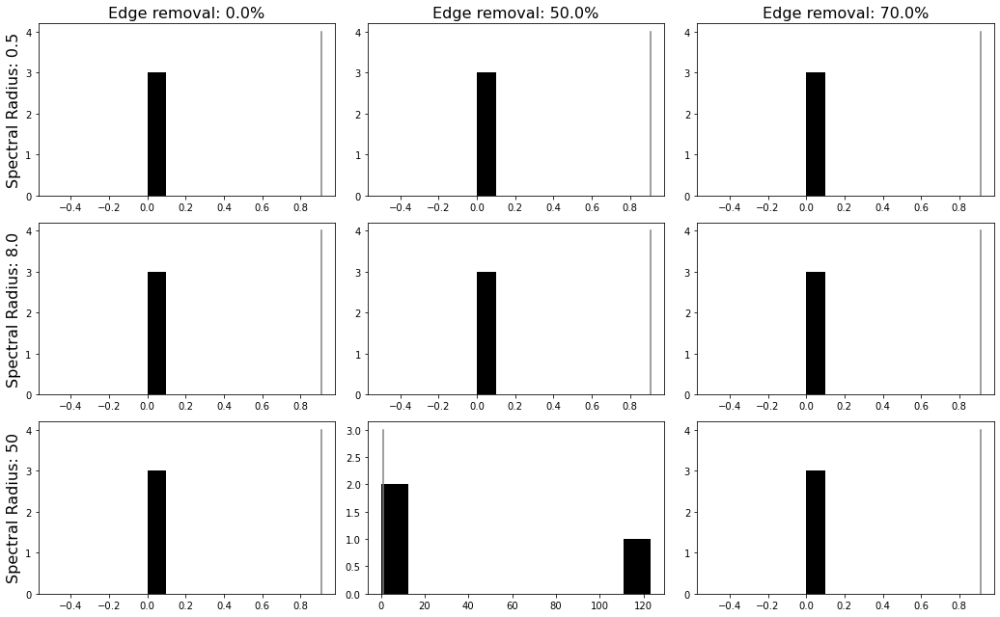

In [112]:
plt.rcParams["figure.figsize"] = [14.5, 9]
i = 1
for rho in [.5, 8.0, 50]:
    for remove_p in [0.0, .5, .7]:
        
        lams, preds = parameter_lyap(rho, remove_p, reps=3)
        L.append(lams)
        P.append(preds)
        print(np.mean(preds))
        
        plt.subplot(3,3, i)
        n, bins, patches = plt.hist(L[i-1], color="k")
        plt.plot(np.ones(10)*0.91, np.linspace(0, np.max(n) + 1, 10), color="gray")
        if (i-1) % 3 == 0:
            plt.ylabel(f"Spectral Radius: {rho}", fontsize=16)
        if i < 4:
            plt.title(f"Edge removal: {remove_p * 100}%", fontsize = 16)
        i += 1
        
plt.tight_layout()
#plt.savefig("nineplots.png", dpi=300)